In [55]:
import matplotlib.pyplot as plt
import networkx as nx
import geopandas as gpd
import libpysal
import numpy as np
import pysal
#from libpysal.weights.contiguity import Queen
from libpysal.weights import Queen, Rook, KNN, Kernel
from splot.libpysal import plot_spatial_weights

In [2]:
path = 'powiaty/powiaty.shp'
# https://github.com/Toblerity/Fiona/issues/548
gdf = gpd.read_file(path) 
for i in range(len(gdf.jpt_nazwa_)):
    gdf.jpt_nazwa_[i] = gdf.jpt_nazwa_[i].encode("latin1","strict").decode('utf-8')
#print(gdf.head())

/home/marek/.local/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [3]:
gdf

,iip_przest,iip_identy,jpt_sjr_ko,jpt_kod_je,jpt_nazwa_,jpt_nazw01,jpt_organ_,jpt_orga01,jpt_jor_id,wazny_do,...,jpt_opis,jpt_sps_ko,gra_ids,status_obi,opis_bledu,typ_bledu,wersja_od,wazny_od,iip_wersja,geometry
0,PL.PZGIK.200,07f182b1-9146-43e5-a62d-836c211f9ff1,POW,0226,złotoryjski,None,None,NZN,0.0,None,...,829314,UZG,None,AKTUALNY,None,None,2012-09-26,2012-09-26,2012-09-27T07:36:28+02:00,"POLYGON ((269083.615610161 370884.074692226, 2..."
1,PL.PZGIK.200,c845cab0-9fbf-4123-9fc3-c70e57ad17fb,POW,0262,Legnica,None,None,NZN,0.0,None,...,829315,UZG,None,AKTUALNY,None,None,2012-09-26,2012-09-26,2012-09-27T07:36:28+02:00,"POLYGON ((296226.608764245 372333.782926137, 2..."
2,PL.PZGIK.200,139e17ec-bbd6-410b-80c0-da7faea2a439,POW,0206,jeleniogórski,None,None,NZN,0.0,None,...,829321,UZG,None,AKTUALNY,None,None,2017-10-10,2012-09-26,2017-10-10T00:00:00+02:00,"POLYGON ((244044.051410248 332419.670858348, 2..."
3,PL.PZGIK.200,65b5a197-3d86-401c-8cea-ea80c3b4bf7c,POW,0204,górowski,None,None,NZN,0.0,None,...,829320,UZG,None,AKTUALNY,None,None,2012-09-26,2012-09-26,2012-09-27T07:36:28+02:00,"POLYGON ((311163.070451319 427025.479951675, 3..."
4,PL.PZGIK.200,258b68f9-31cb-4f37-bbdf-f1824805a0e4,POW,0214,oleśnicki,None,None,NZN,0.0,None,...,829331,UZG,None,AKTUALNY,None,None,2012-09-26,2012-09-26,2012-09-27T07:36:28+02:00,"POLYGON ((377122.144167617 378970.42627759, 37..."
5,PL.PZGIK.200,275bb110-6b8f-4f24-873d-abbb862c02a6,POW,0201,bolesławiecki,None,None,NZN,0.0,None,...,829341,UZG,None,AKTUALNY,None,None,2012-09-26,2012-09-26,2012-09-27T07:36:28+02:00,"POLYGON ((235157.110202526 379452.665019155, 2..."
6,PL.PZGIK.200,f874c206-4613-483b-b34d-feaa8e657dbf,POW,0261,Jelenia Góra,None,None,NZN,0.0,None,...,829316,UZG,None,AKTUALNY,None,None,2017-10-10,2012-09-26,2017-10-10T00:00:00+02:00,"POLYGON ((258831.052330533 329113.697349054, 2..."
7,PL.PZGIK.200,597109f2-464f-46ec-a568-d55db9996a9a,POW,0208,kłodzki,None,None,NZN,0.0,None,...,829324,UZG,None,AKTUALNY,None,None,2017-10-10,2012-09-26,2017-10-10T00:00:00+02:00,"POLYGON ((300898.753857387 288803.394314883, 3..."
8,PL.PZGIK.200,16833a82-0027-41ad-903e-f3b50b74b6fd,POW,0210,lubański,None,None,NZN,0.0,None,...,829326,UZG,None,AKTUALNY,None,None,2017-10-10,2012-09-26,2017-10-10T00:00:00+02:00,"POLYGON ((228421.669316137 366620.160843527, 2..."
9,PL.PZGIK.200,387f7282-f74e-4cad-ac49-fab6a947a1fa,POW,0221,wałbrzyski,None,None,NZN,0.0,None,...,1296647,UZG,None,AKTUALNY,None,None,2017-10-10,2012-09-26,2017-10-10T00:00:00+02:00,"POLYGON ((308068.34802497 335443.71758675, 308..."


In [4]:
weights = Queen.from_dataframe(gdf)

/home/marek/.local/lib/python3.6/site-packages/libpysal/weights/weights.py:170: UserWarning: The weights matrix is not fully connected. There are 2 components
  warnings.warn("The weights matrix is not fully connected. There are %d components" % self.n_components)


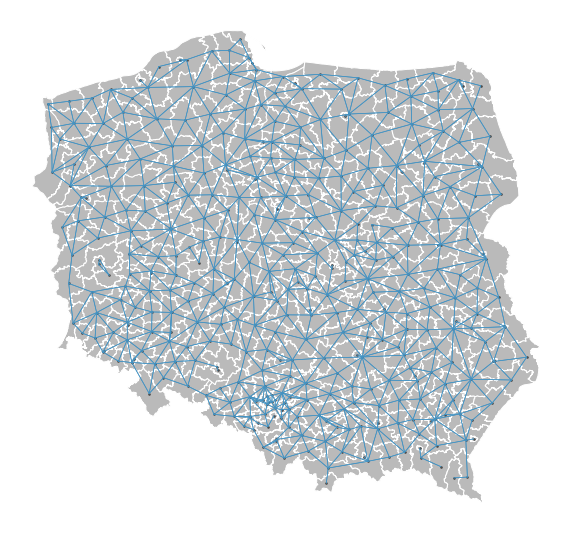

In [5]:
plot_spatial_weights(weights, gdf)
plt.show()

In [6]:
contig_matrix = libpysal.weights.Rook.from_shapefile(path)

# build list of edges - this will create edges going both ways from connected nodes, so you might need to remove duplicates
nodes = contig_matrix.weights.keys()  # to get dict of keys, alternatively use contig_matrix.id2i.keys()
edges = [(node, neighbour) for node in nodes for neighbour in contig_matrix[node]]
my_graph = nx.Graph(edges)

/home/marek/.local/lib/python3.6/site-packages/libpysal/weights/weights.py:168: UserWarning: There are 3 disconnected observations 
  Island ids: 13, 200, 257
  " Island ids: %s" % ', '.join(str(island) for island in self.islands))


/home/marek/.local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


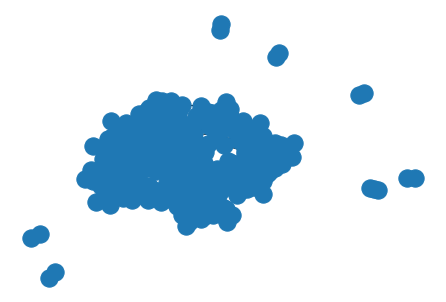

In [7]:
nx.draw(my_graph)  # networkx draw()
plt.draw()  # pyplot draw()
plt.show()

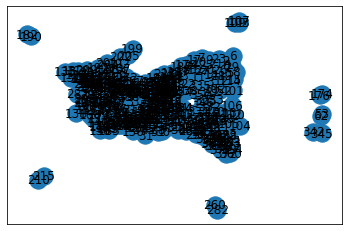

In [8]:
nx.draw_networkx(my_graph, width=10)
#plt.figure(figsize=(100,100))
plt.draw()  # pyplot draw()
plt.show()

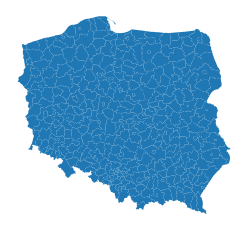

In [9]:
gdf = gpd.read_file(path)
ax = gdf.plot()
ax.set_axis_off()

In [40]:
w_rook = Rook.from_dataframe(gdf)
w_queen = Queen.from_dataframe(gdf)
#https://github.com/pysal/libpysal/blob/master/notebooks/weights.ipynb

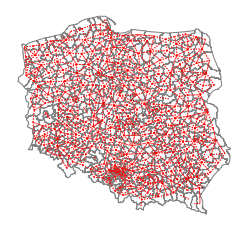

In [11]:
ax = gdf.plot(edgecolor='grey', facecolor='w')
f,ax = w_rook.plot(gdf, ax=ax, 
        edge_kws=dict(color='r', linestyle=':', linewidth=1),
        node_kws=dict(marker=''))
ax.set_axis_off()

In [12]:
w_queen.islands

[]

In [13]:
w_rook.islands
#https://libpysal.readthedocs.io/en/latest/generated/libpysal.weights.Rook.html

[13, 200, 257]

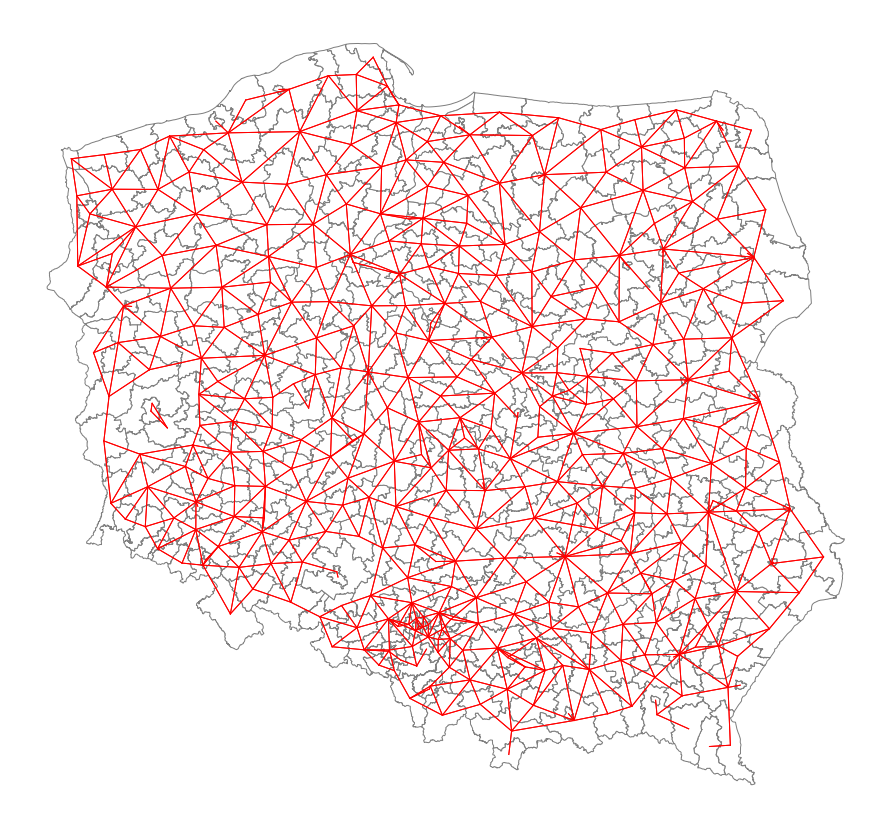

In [14]:
rs_df = gpd.read_file(path)

plt.rcParams["figure.figsize"] = (20,15)

ax = rs_df.plot(edgecolor='grey', facecolor='w')
f,ax = w_queen.plot(rs_df, ax=ax, 
        edge_kws=dict(color='r', linestyle='-', linewidth=1),
        node_kws=dict(marker=''))
#ax.set_title('Rio Grande do Sul: Nonplanar Weights')
ax.set_axis_off()

In [15]:
#http://www.geraintianpalmer.org.uk/2017/09/22/plotting-geopandas/
powiaty = gdf.dissolve(by='jpt_nazwa_') #changes the index to names of dostricts

In [16]:
powiaty

,geometry,iip_przest,iip_identy,jpt_sjr_ko,jpt_kod_je,jpt_nazw01,jpt_organ_,jpt_orga01,jpt_jor_id,wazny_do,...,id_technic,jpt_opis,jpt_sps_ko,gra_ids,status_obi,opis_bledu,typ_bledu,wersja_od,wazny_od,iip_wersja
jpt_nazwa_,,,,,,,,,,,,,,,,,,,,,
BiaÅa Podlaska,"POLYGON ((778720.978496816 470882.528798889, 7...",PL.PZGIK.200,ef1fe2b7-9536-4988-8c48-fdf49e927fea,POW,0661,None,None,NZN,0.0,None,...,0.0,829004,UZG,None,AKTUALNY,None,None,2012-09-26,2012-09-26,2012-09-27T07:39:43+02:00
BiaÅystok,"POLYGON ((771905.526148951 592432.192559302, 7...",PL.PZGIK.200,495a2fe7-0752-4286-ae90-ba3d353deab4,POW,2061,None,None,NZN,0.0,None,...,0.0,829199,UZG,None,AKTUALNY,None,None,2012-09-26,2012-09-26,2012-09-27T09:26:09+02:00
Bielsko-BiaÅa,"POLYGON ((496070.662833074 209573.063219232, 4...",PL.PZGIK.200,9101ccce-72f5-4de8-9dfe-f52ff3d7f3a7,POW,2461,None,None,NZN,0.0,None,...,0.0,829251,UZG,None,AKTUALNY,None,None,2012-09-26,2012-09-26,2012-09-27T09:34:20+02:00
Bydgoszcz,"POLYGON ((424721.984526221 586919.2909570551, ...",PL.PZGIK.200,998e0dad-bfe4-4db4-a53c-9203dc6580a9,POW,0461,None,None,NZN,0.0,None,...,0.0,829360,UZG,None,AKTUALNY,None,None,2012-09-26,2012-09-26,2012-09-27T07:38:30+02:00
Bytom,"POLYGON ((484976.667770651 280624.949737961, 4...",PL.PZGIK.200,80e3a455-2de8-437d-a859-a3548f926c8f,POW,2462,None,None,NZN,0.0,None,...,0.0,829252,UZG,None,AKTUALNY,None,None,2012-09-26,2012-09-26,2012-09-27T09:34:20+02:00
CheÅm,"POLYGON ((808995.029962617 374058.737626974, 8...",PL.PZGIK.200,a5db8b91-e534-4d3e-8f60-9794a579e315,POW,0662,None,None,NZN,0.0,None,...,0.0,829008,UZG,None,AKTUALNY,None,None,2012-09-26,2012-09-26,2012-09-27T07:39:43+02:00
ChorzÃ³w,"POLYGON ((494231.054644117 270592.598567145, 4...",PL.PZGIK.200,4c742151-2adc-43de-9a67-c6c1a26228f1,POW,2463,None,None,NZN,0.0,None,...,0.0,829250,UZG,None,AKTUALNY,None,None,2012-09-26,2012-09-26,2012-09-27T09:34:20+02:00
CzÄstochowa,"POLYGON ((500793.078939961 324472.402174512, 5...",PL.PZGIK.200,e14206f5-a5e9-4365-8e22-df3b8a7950aa,POW,2464,None,None,NZN,0.0,None,...,0.0,829254,UZG,None,AKTUALNY,None,None,2012-09-26,2012-09-26,2012-09-27T09:34:20+02:00
DÄ browa GÃ³rnicza,"POLYGON ((511079.070153294 273954.298874867, 5...",PL.PZGIK.200,38783656-68a4-4068-aa64-c982dad3ddd5,POW,2465,None,None,NZN,0.0,None,...,0.0,829253,UZG,None,AKTUALNY,None,None,2012-09-26,2012-09-26,2012-09-27T09:34:20+02:00


In [17]:
#for i in range(len(powiaty.jpt_nazwa_)):
#    powiaty.jpt_nazwa_[i] = powiaty.jpt_nazwa_[i].encode("latin1","strict").decode('utf-8')
#print(powiaty.jpt_nazwa_)

In [18]:
powiaty['centroid'] = powiaty['geometry'].centroid

(137166.6455996607, 896406.6565782154, 101133.95416049588, 807108.9159837497)

/home/marek/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 130 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/home/marek/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 130 missing from current font.
  font.set_text(s, 0, flags=flags)
/home/marek/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 153 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/home/marek/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 153 missing from current font.
  font.set_text(s, 0, flags=flags)
/home/marek/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 133 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/home/marek/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 133 missin

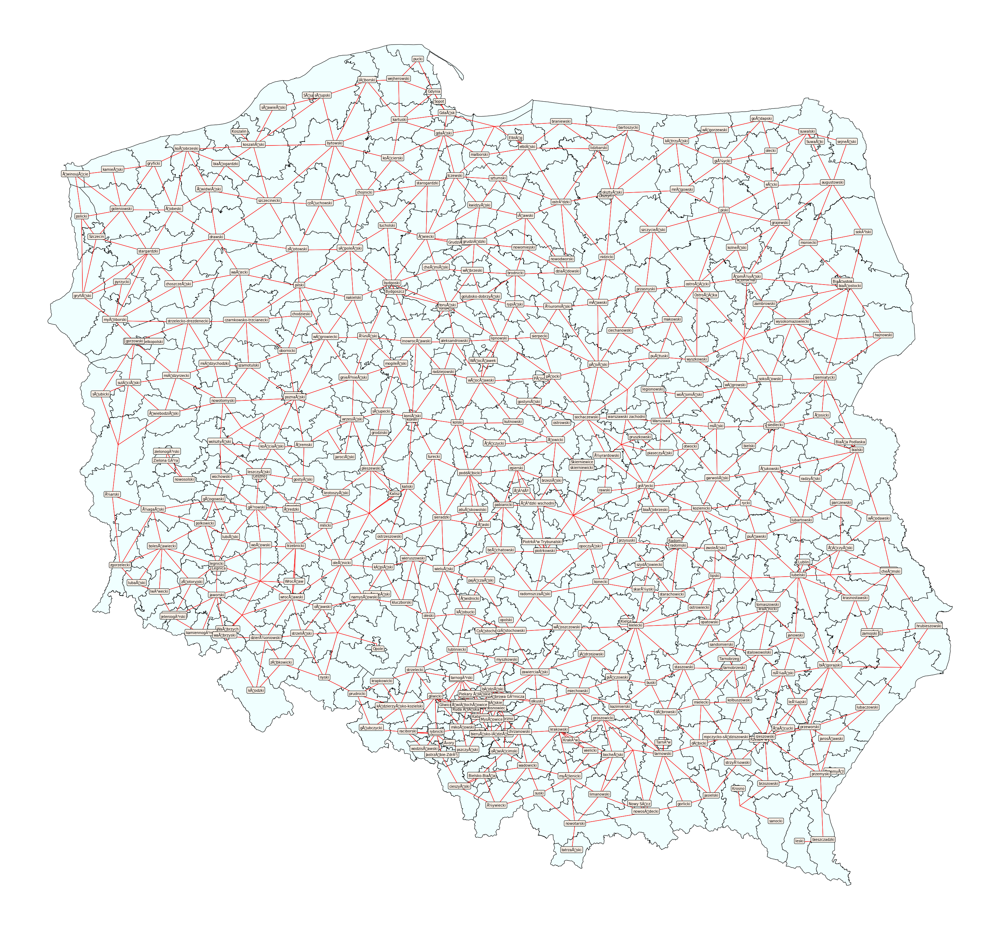

In [19]:
plt.rcParams["figure.figsize"] = (50,50)

ax = rs_df.plot(edgecolor='grey', facecolor='w')
fig, ax = w_queen.plot(rs_df, ax=ax, 
        edge_kws=dict(color='r', linestyle='-', linewidth=1),
        node_kws=dict(marker=''))
#plt.subplots(1, figsize=(50,50))
powiaty.plot(color='azure', edgecolor='black', ax=ax)
props = dict(boxstyle='round', facecolor='linen', alpha=1)
for point in powiaty.iterrows():
    ax.text(point[1]['centroid'].x,
            point[1]['centroid'].y,
            point[0],
            horizontalalignment='center',
            fontsize=10,
            bbox=props)

ax.axis('off')
#plt.savefig('powiaty.png')

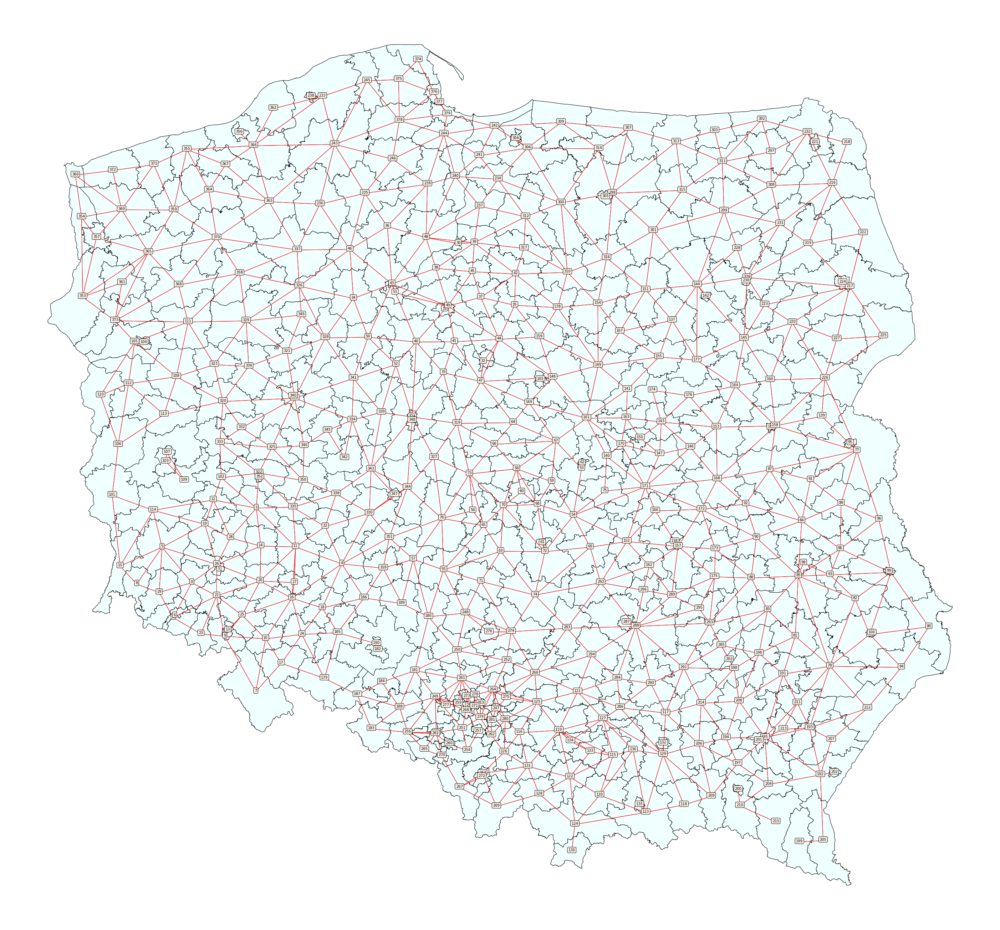

In [20]:
powiaty2 = gdf
powiaty2['centroid'] = powiaty2['geometry'].centroid

plt.rcParams["figure.figsize"] = (50,50)

ax = rs_df.plot(edgecolor='grey', facecolor='w')
fig, ax = w_queen.plot(rs_df, ax=ax, 
        edge_kws=dict(color='r', linestyle='-', linewidth=1),
        node_kws=dict(marker=''))
#plt.subplots(1, figsize=(50,50))
powiaty.plot(color='azure', edgecolor='black', ax=ax)
props = dict(boxstyle='round', facecolor='linen', alpha=1)
for point in powiaty2.iterrows():
    ax.text(point[1]['centroid'].x,
            point[1]['centroid'].y,
            point[0],
            horizontalalignment='center',
            fontsize=10,
            bbox=props)

ax.axis('off')
#plt.savefig('gfd.png')

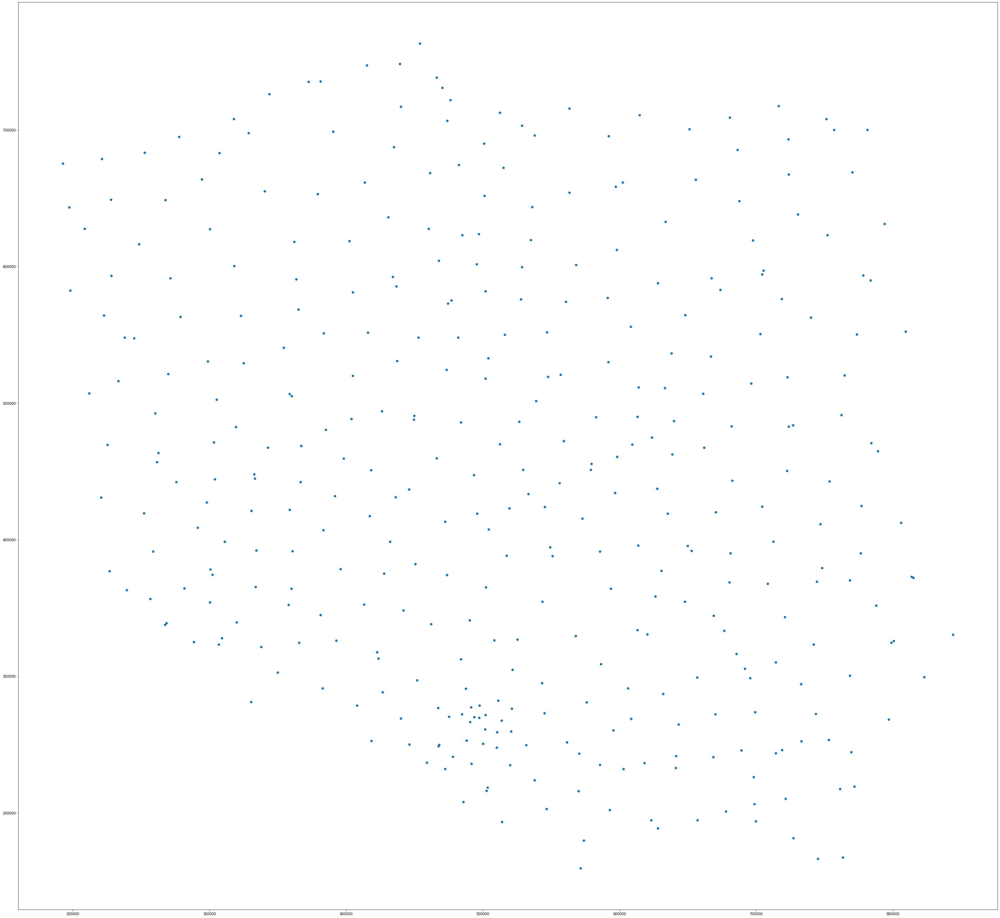

In [21]:
#http://darribas.org/gds15/content/labs/lab_03.html
cents = gdf.centroid
cents.plot()

(<Figure size 720x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f983e327cf8>)

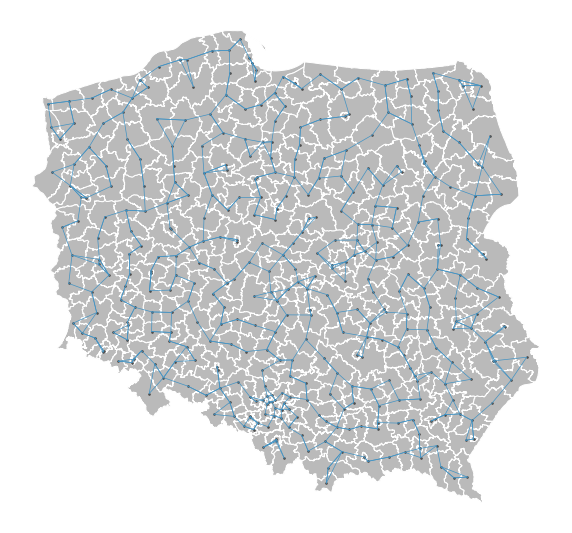

In [22]:
#http://pysal.org/notebooks/viz/splot/libpysal_non_planar_joins_viz
w_knn = KNN.from_dataframe(gdf)
plot_spatial_weights(w_knn, gdf)

In [42]:
w_queen.neighbors[215] = w_queen.neighbors[215] + [199]
w_queen.neighbors[199] = w_queen.neighbors[199] + [215]
w_queen.neighbors[109] = w_queen.neighbors[109] + [333, 102, 12, 114]
w_queen.neighbors[107] = w_queen.neighbors[107] + [333, 320, 113, 106, 101]

In [47]:
w_queen.neighbor_offsets[215] = w_queen.neighbor_offsets[215] + [199]
w_queen.neighbor_offsets[199] = w_queen.neighbor_offsets[199] + [215]
w_queen.neighbor_offsets[109] = w_queen.neighbor_offsets[109] + [333, 102, 12, 114]
w_queen.neighbor_offsets[107] = w_queen.neighbor_offsets[107] + [333, 320, 113, 106, 101]

(<Figure size 720x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f983cad80b8>)

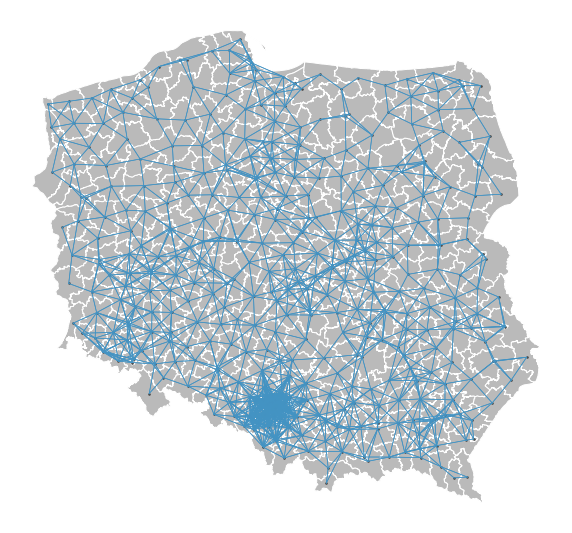

In [56]:
w_kernel = Kernel.from_dataframe(gdf)
plot_spatial_weights(w_kernel, gdf)

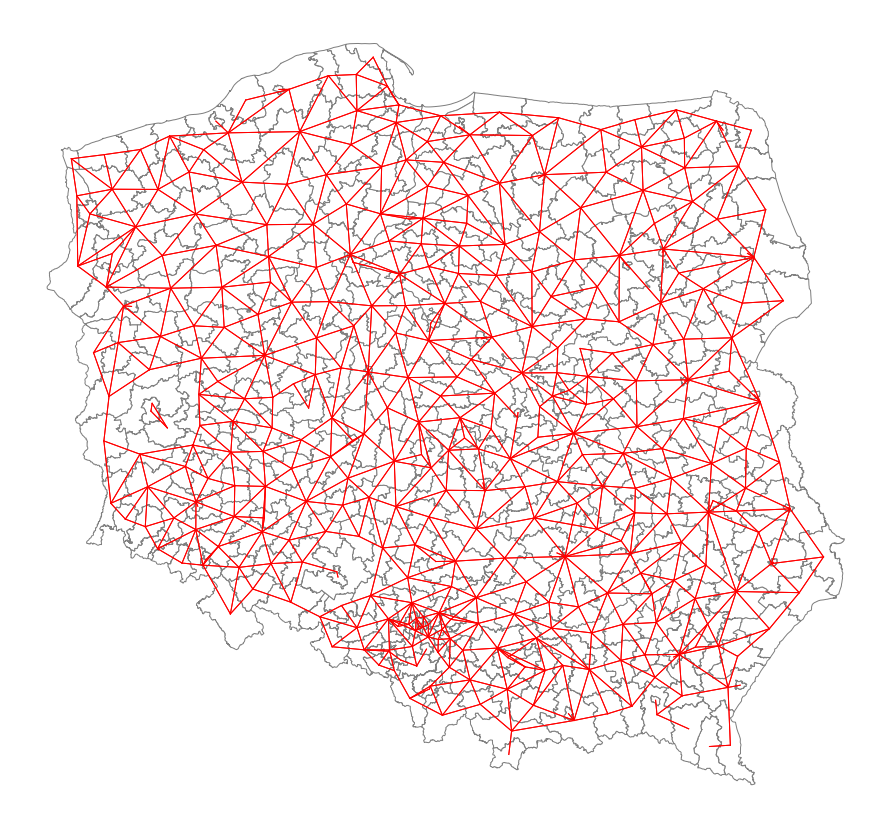

In [66]:
path = 'powiaty/powiaty.shx'
# https://github.com/Toblerity/Fiona/issues/548
rs_df = gpd.read_file(path)

plt.rcParams["figure.figsize"] = (20,15)

w_queen = Queen.from_dataframe(gdf)

ax = rs_df.plot(edgecolor='grey', facecolor='w')
f,ax = w_queen.plot(rs_df, ax=ax, 
        edge_kws=dict(color='r', linestyle='-', linewidth=1),
        node_kws=dict(marker=''))
#ax.set_title('Rio Grande do Sul: Nonplanar Weights')
ax.set_axis_off()

In [92]:
#http://darribas.org/gds_scipy16/ipynb_md/03_spatial_weights.html
from pylab import figure, scatter, show
fig = figure(figsize=(9,9))

print(gdf.geometry.centroid[0])

centroids = np.array([list(poly) for poly in gdf.geometry.centroid])

print(centroids)

plt.plot(centroids[:,0], centroids[:,1],'.')
#plt.plot(s04[:,0], s04[:,1], '-')
plt.ylim([25,37])
for k,neighs in w_queen.neighbors.items():
    #print(k,neighs)
    origin = centroids[k]
    for neigh in neighs:
        segment = centroids[[k,neigh]]
        plt.plot(segment[:,0], segment[:,1], '-')
plt.title('Queen Neighbor Graph')
show()

POINT (281548.036037852 364257.5160729217)


TypeError: 'Point' object is not iterable

<Figure size 648x648 with 0 Axes>